<a href="https://colab.research.google.com/github/chiragtyagi2003/Irish_Music_Generator/blob/main/IrishMusicGenerator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Irish Music Generator using RNNs

Install Dependencies

In [2]:
# Import Tensorflow 2.0
%tensorflow_version 2.x
import tensorflow as tf

# Download and import the MIT Introduction to Deep Learning package
!pip install mitdeeplearning
import mitdeeplearning as mdl

# Import all remaining packages
import numpy as np
import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm
!apt-get install abcmidi timidity > /dev/null 2>&1

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 30.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for mitdeeplearning: filename=mitdeeplearning-0.3.0-py3-none-any.whl size=2117305 sha256=2f181a8f0988414e4b3db2d7a3bfa919f5e090bea67f041f9526782e4a2b1efe
  Stored in directory: /root/.cache/pip/wheels/9c/9f/b5/0e31f83bc60a83625e37429f923934e26802d0d68cf3ef3216
Successfully built mitdeeplearning


Import Dataset

In [3]:
#downloading the dataset
songs = mdl.lab1.load_training_data()

Found 817 songs in text


Examining the Dataset

In [4]:
#inspecting the songs in dataset
example_song = songs[56]
print('Example Song: \n')
print(example_song)
print('\n')

Example Song: 

X:55
T:Spell on the Fiddler
Z: id:dc-hornpipe-67
M:C|
L:1/8
K:G Major
(3DEF|GDBG dBgd|bgdB cBAG|Fd^cd Adce|d2ed cAFA|!
GDBG dBgd|bgdB cBAG|fedc edBG|FADF G2:|!
ga|bgdB GBdg|afcA FAcf|afbg c'abg|agfe dcBA|!
GDBG dBgd|bgdB cBAG|fedc edBG|FADF G2:|!




Converting the song from text to audio

In [5]:
# converting the song from ABC notation to Audio
mdl.lab1.play_song(example_song)

Data PreProcessing

In [6]:
# join the list of all songs into one song
songs_joined = "\n\n".join(songs)

# print('\n\n', songs_joined, '\n\n')

# find number of unique characters in the joined string
# this will help determine the length of our vocabulory dict
vocab = sorted(set(songs_joined))
print('\n\n There are', len(vocab), " unique characters in the dataset.\n")



 There are 83  unique characters in the dataset.



In [ ]:
print('\n\n', vocab, '\n\n')



 ['\n', ' ', '!', '"', '#', "'", '(', ')', ',', '-', '.', '/', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', ':', '<', '=', '>', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', '[', ']', '^', '_', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', '|'] 




/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
# vectorizing the text data

# create mapping from char to unique index
# loop the list with enumerate and make key value pairs
char2idx = {u:i for i,u in enumerate(vocab)}

# create mapping from index to char
# just conver the vocab list to an array
idx2char = np.array(vocab)

In [ ]:
for char, _ in zip(char2idx, range(20)):
  print('{}: {}'.format(repr(char), char2idx[char]))

'\n': 0
' ': 1
'!': 2
'"': 3
'#': 4
"'": 5
'(': 6
')': 7
',': 8
'-': 9
'.': 10
'/': 11
'0': 12
'1': 13
'2': 14
'3': 15
'4': 16
'5': 17
'6': 18
'7': 19


In [8]:
# function to vectorize the songs string

def vectorize_string(string):
  vectorized_output = np.array([char2idx[char] for char in string])
  return vectorized_output


In [9]:
vectorized_songs = vectorize_string(songs_joined)

In [ ]:
print('{} --- chars mapped to int ---> {}'.format(repr(songs_joined[:10]), vectorized_songs[:10]))

assert isinstance(vectorized_songs, np.ndarray)

'X:1\nT:Alex' --- chars mapped to int ---> [49 22 13  0 45 22 26 67 60 79]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Creating Training Dataset

In [10]:
# function to create batches
def get_batch(vectorized_songs, seq_length, batch_size):
  '''function to create training set datapoints '''

  # the length of vectorized_songs string
  n = vectorized_songs.shape[0] - 1

  # randomly choosing the starting indices for the example in training batch
  idx = np.random.choice(n-seq_length, batch_size)


  # construct a list input sequences for trainig batch
  input_batch = [vectorized_songs[i: i+seq_length] for i in idx]

  # construcct a list of target sequences for training batch
  output_batch = [vectorized_songs[i+1 : i+seq_length+1] for i in idx]

  # transform into x_batch and y_batch arrays
  x_batch = np.reshape(input_batch, [batch_size, seq_length])
  y_batch = np.reshape(output_batch, [batch_size, seq_length])

  return x_batch, y_batch

In [11]:
# test the function
x_train_batch, y_train_batch = get_batch(vectorized_songs, 10, 2)

print(x_train_batch)
print('\n\n', y_train_batch)

[[29  1 32 26 82 27 60  1 60 62]
 [32 14 22 82  2  0 61 82 62 61]]


 [[ 1 32 26 82 27 60  1 60 62 11]
 [14 22 82  2  0 61 82 62 61 60]]


Define the RNN model

In [12]:
# function to add an LSTM layer
def LSTM(rnn_units):
  return tf.keras.layers.LSTM(
      rnn_units,
      return_sequences = True,
      recurrent_initializer = 'glorot_uniform',
      recurrent_activation = 'sigmoid',
      stateful = True,
  )

In [13]:
# function to create the RNN model

def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
  ''' function to add layers to the model and build it'''

  model = tf.keras.Sequential([

  # layer1: embedding input layer
  tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape = [batch_size, None]),

  # layer2: LSTM with rnn_units
  LSTM(rnn_units),

  # layer2: Dense layer -> transforms the output of LSTM to vocab size
  tf.keras.layers.Dense(vocab_size)


  ])

  return model




In [14]:
# testing the build model function
model = build_model(len(vocab), embedding_dim = 256, rnn_units = 1024, batch_size=32)


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (32, None, 256)           21248     
                                                                 
 lstm (LSTM)                 (32, None, 1024)          5246976   
                                                                 
 dense (Dense)               (32, None, 83)            85075     
                                                                 
Total params: 5,353,299
Trainable params: 5,353,299
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# checking the dim of our output

x, y = get_batch(vectorized_songs, seq_length =100, batch_size = 32)
pred = model(x)

print('Input_Shape: ' , x.shape)

print('Prediction_Shape: ', pred.shape)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Input_Shape:  (32, 100)
Prediction_Shape:  (32, 100, 83)


Defining the Loss function

In [15]:
def compute_loss(labels, logits):
  '''function to compute loss'''
  loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits = True)
  return loss

Training the model

In [16]:
# set some hyperparameters
# Optimization parameters:
num_training_iterations = 2000  # Increase this to train longer
batch_size = 4  # Experiment between 1 and 64
seq_length = 100  # Experiment between 50 and 500
learning_rate = 5e-3  # Experiment between 1e-5 and 1e-1

# Model parameters:
vocab_size = len(vocab)
embedding_dim = 256
rnn_units = 1024  # Experiment between 1 and 2048

# Checkpoint location:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")


In [17]:
# training method
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size)

optimizer = tf.keras.optimizers.Adam(learning_rate)


@tf.function
def train_step(x, y):
    with tf.GradientTape() as tape:

      # get predictions
      y_hat = model(x)

      # compute the loss
      loss = compute_loss(y, y_hat)

      # compute the gradients with respect all the params
      grads = tape.gradient(loss, model.trainable_variables)

      # apply the grads to optimizer
      optimizer.apply_gradients(zip(grads, model.trainable_variables))

      return loss

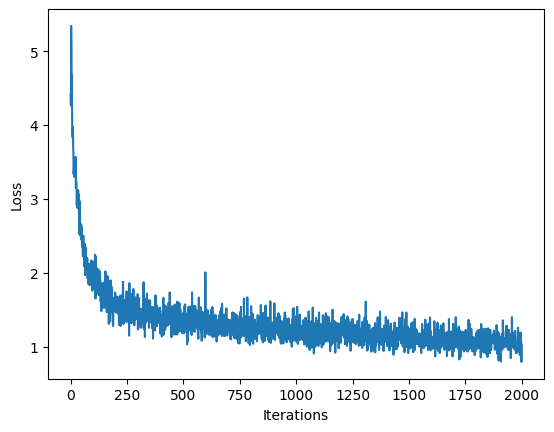

100%|██████████| 2000/2000 [2:53:13<00:00,  5.20s/it]


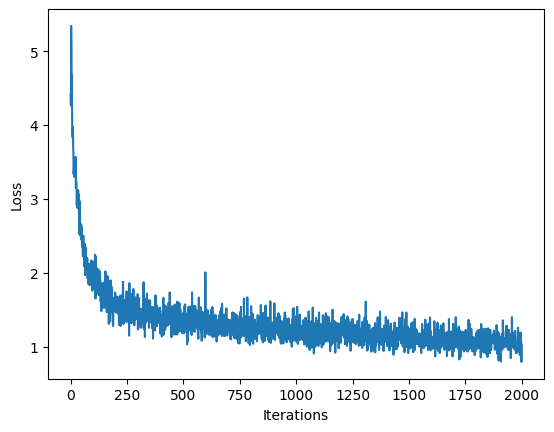

In [18]:
# begin training
history = []
plotter = mdl.util.PeriodicPlotter(sec=2, xlabel='Iterations', ylabel='Loss')
if hasattr(tqdm, '_instances'): tqdm._instances.clear() # clear if it exists

for iter in tqdm(range(num_training_iterations)):

  # Grab a batch and propagate it through  the network
  x_batch, y_batch = get_batch(vectorized_songs, seq_length, batch_size)
  loss = train_step(x_batch, y_batch)

  # Update the progress bar
  history.append(loss.numpy().mean())
  plotter.plot(history)

  # Update the model with the changed weights!
  if iter % 100 == 0:
    model.save_weights(checkpoint_prefix)

# Save the trained model and the weights
model.save_weights(checkpoint_prefix)